In [1]:
import pickle as pkl
import numpy as np
import os

In [2]:
solution_folder = '../results/20210707'

with open(os.path.join(solution_folder, 'synWeights.pkl'), 'rb') as f:
    synWeights = pkl.load(f)
    
with open(os.path.join(solution_folder, 'synWeights_final.pkl'), 'rb') as f:
    synWeightsFinal = pkl.load(f)


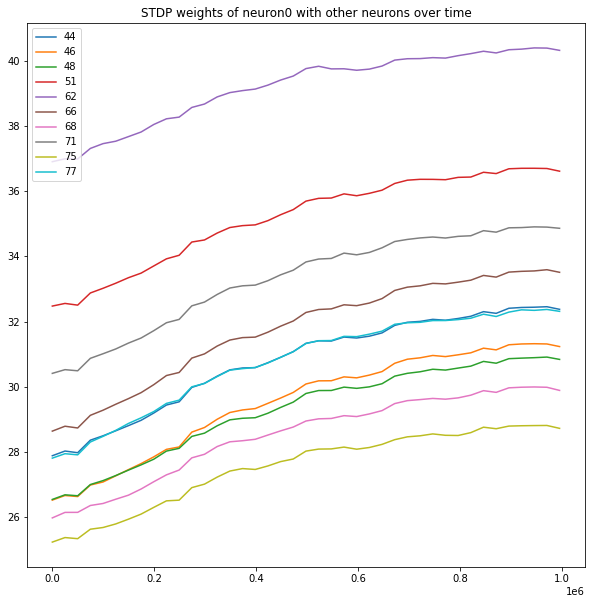

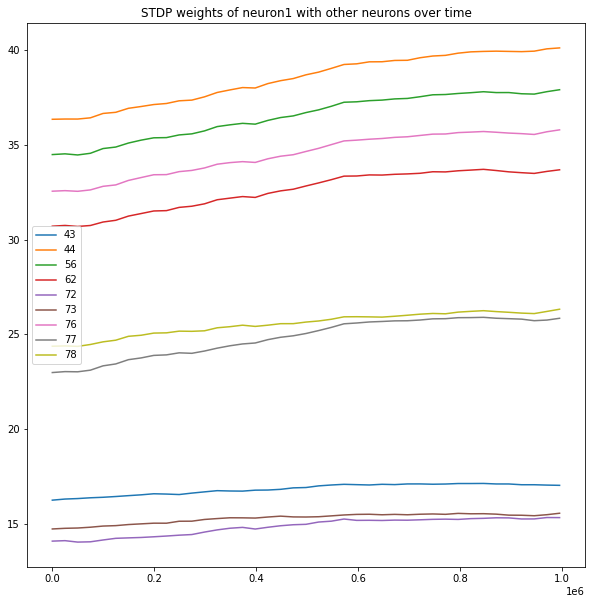

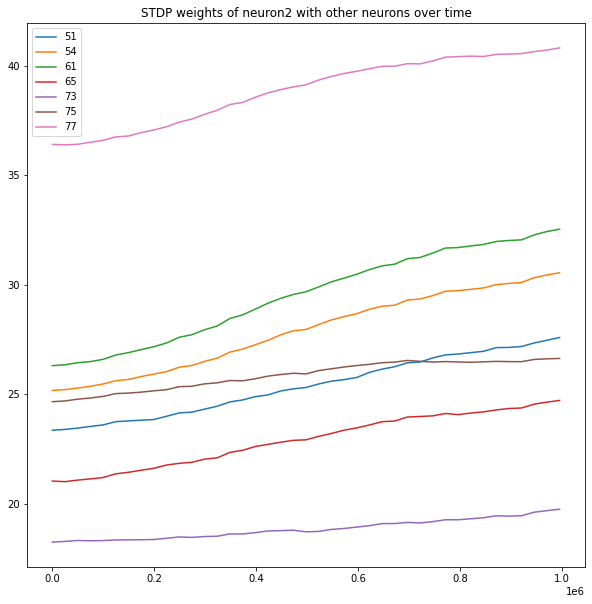

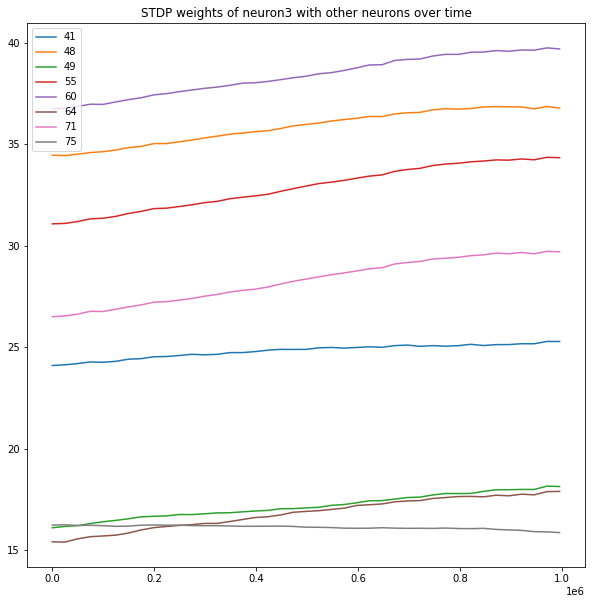

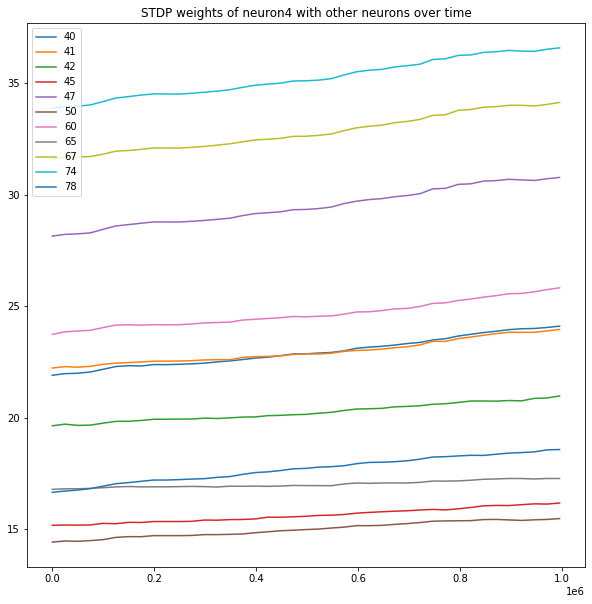

...

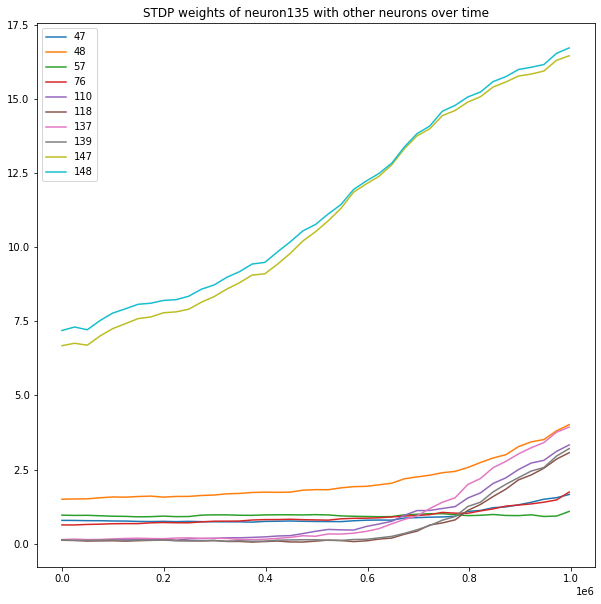

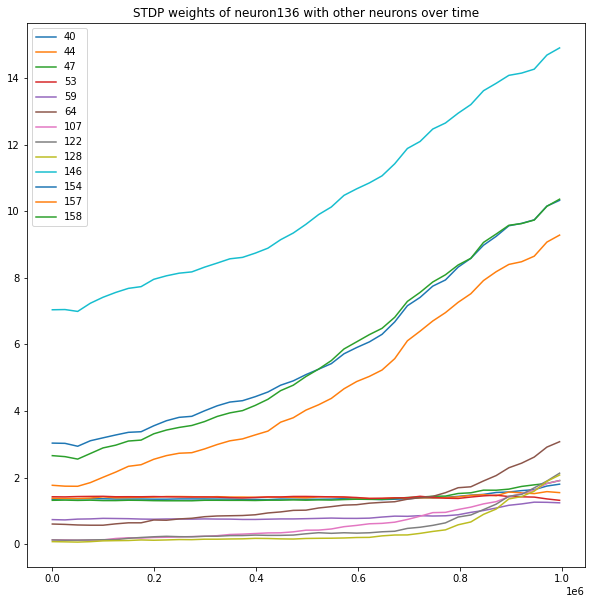

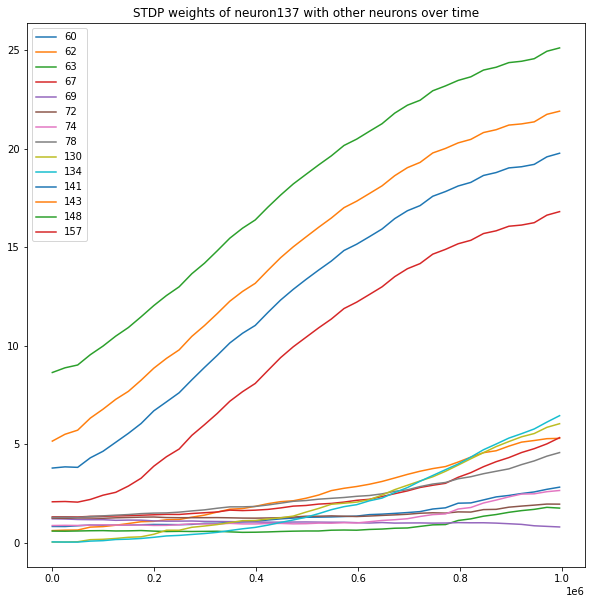

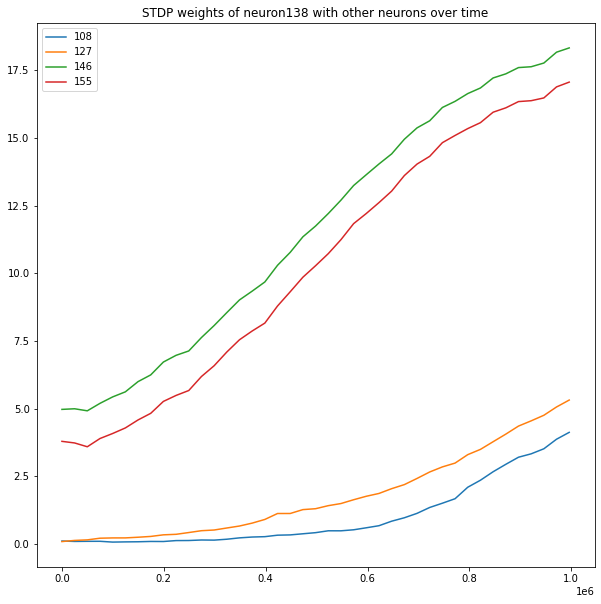

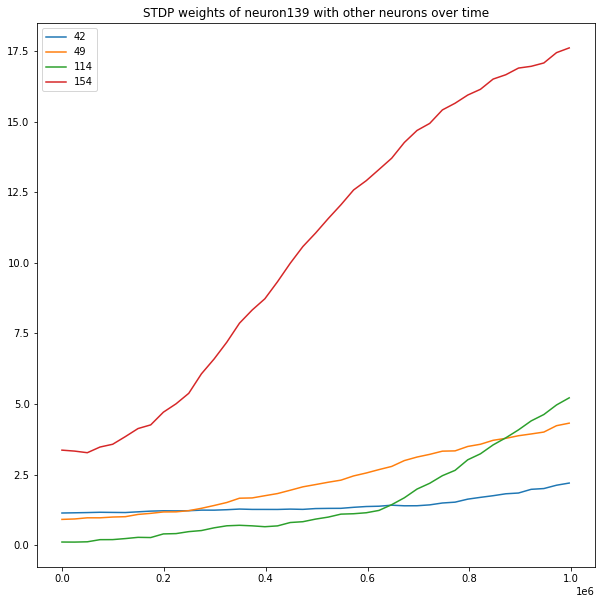

2140


In [3]:
import matplotlib.pyplot as plt

t = 0
for n1, n1conns in sorted(list(synWeights.items()), key=lambda x:x[0]):
    plt.figure(figsize=(10,10))
    for n2, w in n1conns.items():
        plt.plot([x for x,y in w], [y for x,y in w])
    plt.title('STDP weights of neuron{} with other neurons over time'.format(n1))
    plt.legend([str(n2) for n2 in n1conns.keys()])
    plt.show()
    t += len(n1conns)
    
print(t)

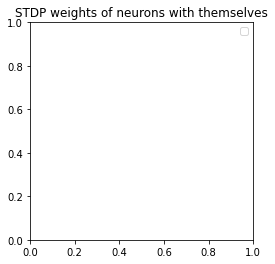

2140


In [6]:
# measure the links of neurons with itself

t = 0
plt.figure(figsize=(4,4))
legend = []
for n1, n1conns in sorted(list(synWeights.items()), key=lambda x:x[0]):
    for n2, w in n1conns.items():
        if n1 == n2:
            print('here')
            plt.plot([x for x,y in w], [y for x,y in w])
            legend.append(n1)
    t += len(n1conns)
    
plt.title('STDP weights of neurons with themselves')
plt.legend(legend)
plt.show()
    
print(t)

In [7]:
import pandas as pd

updates = {}
LEN_W = None
for n1, n1conns in synWeights.items():
    for n2, w in n1conns.items():
        if not LEN_W:
            LEN_W = len(w)
            updates = dict([(i,[]) for i in range(len(w)-1)])
        assert LEN_W == len(w)
        for i, (x1,y1) in enumerate(w):
            if i == len(w) - 1:
                break
            x2,y2 = w[i+1]
            
            updates[i].append(y2-y1)

df_st = pd.DataFrame(
    [(np.mean(chgs), np.std(chgs), np.amin(chgs), np.amax(chgs)) for i,chgs in updates.items()],
    columns=['mean', 'std', 'min', 'max'])
df_st

,mean,std,min,max
0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0


In [16]:
pd.set_option('display.max_rows', None)

In [18]:
df_st.describe()

,mean,std,min,max
count,99.000000,99.000000,99.000000,99.000000
mean,0.091557,0.083112,-0.137936,0.289943
std,0.089585,0.014751,0.091593,0.100532
min,-0.160896,0.051326,-0.457697,0.015641
25%,0.039367,0.072277,-0.200705,0.217815
50%,0.094425,0.080320,-0.118154,0.300735
75%,0.149860,0.093580,-0.074361,0.367193
max,0.290274,0.126746,0.052922,0.513999


In [21]:
0.289943 / 1.8

0.16107944444444444

### Look at critic rewards and punishments

In [30]:
import csv

header = ['time', 'move', 'critic']

rewards = []
with open(os.path.join(solution_folder, 'ActionsRewards.txt')) as f:
    for row in csv.reader(f, delimiter='\t'):
        j = dict([(k, float(v)) for k,v in zip(header, row)])
        rewards.append(j)

In [31]:
pos_rewards = [row for row in rewards if row['critic'] > 0]
neg_rewards = [row for row in rewards if row['critic'] < 0]

In [32]:
pos_rewards

[{'time': 49.8, 'move': 1.0, 'critic': 0.07956},
 {'time': 99.6, 'move': 0.0, 'critic': 4.00364},
 {'time': 249.0, 'move': 0.0, 'critic': 3.93969},
 {'time': 298.8, 'move': 0.0, 'critic': 3.87166},
 {'time': 547.8, 'move': 1.0, 'critic': 4.46568},
 {'time': 597.6, 'move': 1.0, 'critic': 4.38461},
 {'time': 647.4, 'move': 1.0, 'critic': 4.32783},
 {'time': 747.0, 'move': 1.0, 'critic': 4.29551},
 {'time': 846.6, 'move': 1.0, 'critic': 4.26526},
 {'time': 996.0, 'move': 1.0, 'critic': 4.20817},
 {'time': 1045.8, 'move': 1.0, 'critic': 4.15107},
 {'time': 1195.2, 'move': 1.0, 'critic': 4.09421},
 {'time': 1245.0, 'move': 1.0, 'critic': 4.0327},
 {'time': 1394.4, 'move': 1.0, 'critic': 3.96633},
 {'time': 1444.2, 'move': 1.0, 'critic': 3.89891},
 {'time': 1593.6, 'move': 1.0, 'critic': 3.81096},
 {'time': 1643.4, 'move': 1.0, 'critic': 3.7338},
 {'time': 1743.0, 'move': 1.0, 'critic': 3.66355},
 {'time': 1842.6, 'move': 1.0, 'critic': 3.57852},
 {'time': 2041.8, 'move': 1.0, 'critic': 0.05

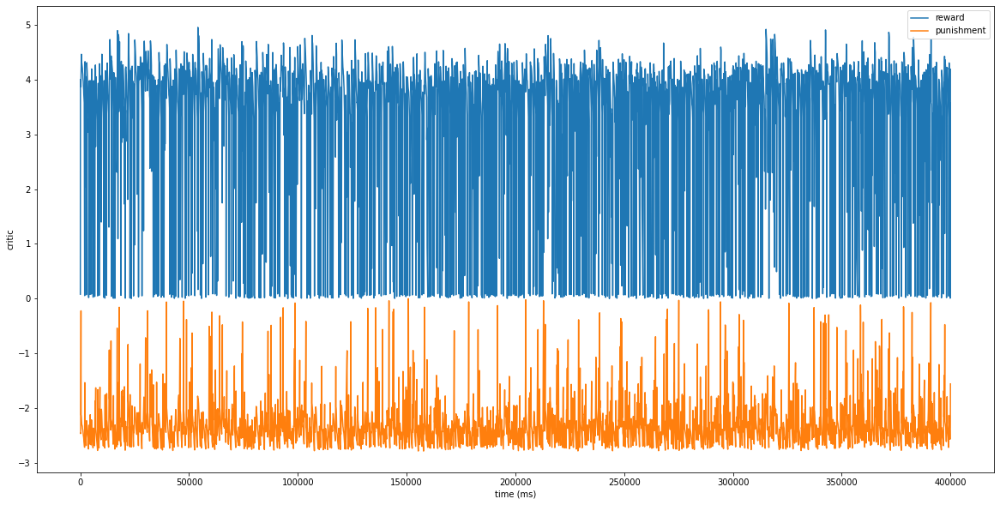

In [36]:
plt.figure(figsize=(20,10))

plt.plot([k['time'] for k in pos_rewards], [k['critic'] for k in pos_rewards])
plt.plot([k['time'] for k in neg_rewards], [k['critic'] for k in neg_rewards])

plt.legend(['reward', 'punishment'])
plt.xlabel('time (ms)')
plt.ylabel('critic')

plt.show()